# Установка необходимых библиотек

In [ ]:
# установка clearml для логирования
!pip install clearml

In [ ]:
# установка библиотеки pandas_profiling - для генерации описательной статистики данных
!pip install ydata-profiling

In [ ]:
# установка библиотеки optuna для тюнинга гиперпараметров лучшей модели
!pip install optuna

In [ ]:
# установка библиотеки pусаret - для low-code сравнения различных моделей
!pip install pycaret

In [7]:
# готовим ClearML к логированию
from clearml import Task

task = Task.init(project_name='Menstrual Cycle Calender', task_name='First try')

ClearML Task: created new task id=74fa14b73a424a69b1eb7848b00383fc
2024-12-14 12:01:21,034 - clearml.Task - INFO - Storing jupyter notebook directly as code
ClearML results page: https://app.clear.ml/projects/eeab3d4e9e04435fbeb3fccb192e6261/experiments/74fa14b73a424a69b1eb7848b00383fc/output/log


# Базовый EDA

In [58]:
# импорт необходимых библиотек
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import mean_squared_error
from ydata_profiling import ProfileReport

from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor

import optuna
from tqdm import tqdm
from pycaret.regression import *

import warnings
warnings.filterwarnings("ignore")

In [ ]:
# закидываем данные в ClearML
from clearml import Dataset

dataset = Dataset.create(dataset_project='Menstrual Cycle Calender', dataset_name='Menstrual Cycle Data')
dataset.add_files('menstrual_cycle_data.csv')
dataset.upload()
dataset.finalize()

In [15]:
# считывание файла с данными и предпросмотр
df = pd.read_csv("menstrual_cycle_data.csv")
df.head(10)

,ClientID,CycleNumber,Group,CycleWithPeakorNot,ReproductiveCategory,LengthofCycle,MeanCycleLength,EstimatedDayofOvulation,LengthofLutealPhase,FirstDayofHigh,...,Method,Prevmethod,Methoddate,Whychart,Nextpreg,NextpregM,Spousesame,SpousesameM,Timeattemptpreg,BMI
0,nfp8122,1,0,1,0,29,27.33,17,12,12,...,9,,,2,7,7,1,1,0,21.254724111867
1,nfp8122,2,0,1,0,27,,15,12,13,...,,,,,,,,,,
2,nfp8122,3,0,1,0,29,,15,14,,...,,,,,,,,,,
3,nfp8122,4,0,1,0,27,,15,12,13,...,,,,,,,,,,
4,nfp8122,5,0,1,0,28,,16,12,12,...,,,,,,,,,,
5,nfp8122,6,0,1,0,26,,15,11,10,...,,,,,,,,,,
6,nfp8122,7,0,1,0,29,,16,13,,...,,,,,,,,,,
7,nfp8122,8,0,1,2,24,,14,10,9,...,,,,,,,,,,
8,nfp8122,9,0,1,0,28,,16,12,9,...,,,,,,,,,,
9,nfp8122,10,0,1,0,28,,17,11,13,...,,,,,,,,,,


In [16]:
# узнаем размерность данных
df.shape

(1665, 80)

In [17]:
# выводим все уникальные значения в каждой колонке
for cols in df.columns:
    print(f"{cols} : \n {df[cols].unique()} \n \n")

ClientID : 
 ['nfp8122' 'nfp8114' 'nfp8109' 'nfp8107' 'nfp8106' 'nfp8024' 'nfp8020'
 'nfp8026' 'nfp8030' 'nfp8031' 'nfp8032' 'nfp8034' 'nfp8036' 'nfp8040'
 'nfp8041' 'nfp8042' 'nfp8043' 'nfp8045' 'nfp8046' 'nfp8047' 'nfp8049'
 'nfp8050' 'nfp8051' 'nfp8057' 'nfp8058' 'nfp8060' 'nfp8062' 'nfp8063'
 'nfp8064' 'nfp8066' 'nfp8068' 'nfp8069' 'nfp8072' 'nfp8073' 'nfp8074'
 'nfp8076' 'nfp8079' 'nfp8080' 'nfp8083' 'nfp8085' 'nfp8087' 'nfp8091'
 'nfp8094' 'nfp8099' 'nfp8100' 'nfp8101' 'nfp8102' 'nfp8110' 'nfp8113'
 'nfp8116' 'nfp8123' 'nfp8124' 'nfp8129' 'nfp8131' 'nfp8133' 'nfp8137'
 'nfp8140' 'nfp8143' 'nfp8144' 'nfp8149' 'nfp8150' 'nfp8152' 'nfp8154'
 'nfp8155' 'nfp8159' 'nfp8161' 'nfp8164' 'nfp8165' 'nfp8168' 'nfp8172'
 'nfp8173' 'nfp8174' 'nfp8176' 'nfp8177' 'nfp8178' 'nfp8179' 'nfp8184'
 'nfp8186' 'nfp8187' 'nfp8188' 'nfp8189' 'nfp8190' 'nfp8192' 'nfp8193'
 'nfp8195' 'nfp8196' 'nfp8197' 'nfp8200' 'nfp8206' 'nfp8207' 'nfp8209'
 'nfp8210' 'nfp8211' 'nfp8212' 'nfp8218' 'nfp8221' 'nfp8223' 'nf

In [18]:
# заменяем пропуски на np.nan, чтобы унифицировать пропущенные значения
df = df.replace(' ', np.nan)
df.isnull().sum()

ClientID                   0
CycleNumber                0
Group                      0
CycleWithPeakorNot         0
ReproductiveCategory       0
                        ... 
NextpregM               1524
Spousesame              1523
SpousesameM             1523
Timeattemptpreg         1523
BMI                     1534
Length: 80, dtype: int64

In [19]:
# проверяем количество колонок с пустыми значениями и без пустых значений
cols_with_missing_cols = []
cols_without_missing_values = []

for cols in df.columns:
    if df[cols].isnull().sum() == 0:
        cols_without_missing_values.append(cols)
    else:
        cols_with_missing_cols.append(cols)

print(f'Кол-во колонок без пустых значений: {len(cols_without_missing_values)}')
print(f'Кол-во колонок с пустыми значениями: {len(cols_with_missing_cols)}')

Кол-во колонок без пустых значений: 6
Кол-во колонок с пустыми значениями: 74


In [20]:
# узнаем количество пропущенных значений в колонке
null = df.isnull().sum().sort_values(ascending=False)
# узнаем их процент
null_per = ((df.isnull().sum()) / (df.shape[0])).sort_values(ascending=False)*100.

# создаем датафрейм для визуализации
null_values = pd.DataFrame({
    "Название колонки": null.index,
    "Всего пропущенных значений": null.values,
    "Процент пропущенных значений": null_per.values
})

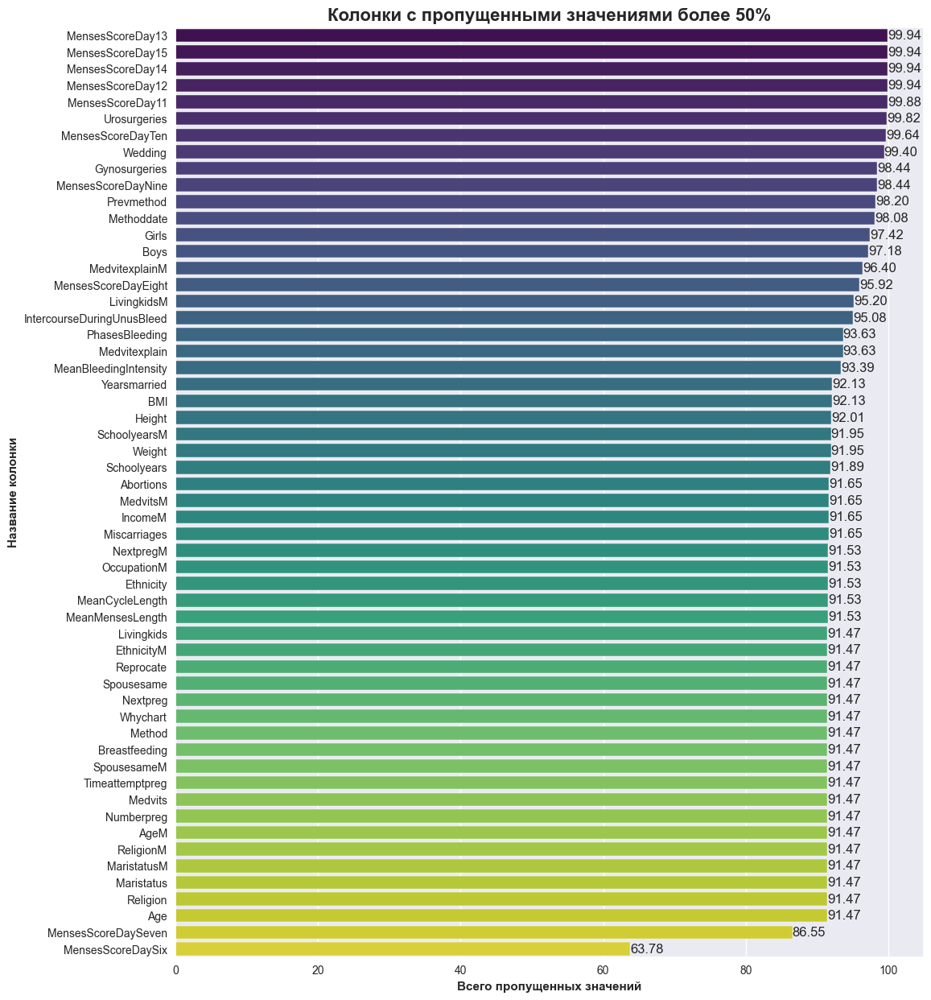

In [22]:
# визуализируем колонки с пропущенными значениями с помощью seaborn
sns.set_style('darkgrid')
plt.figure(figsize=(12, 15))

ax = sns.barplot(data=null_values[null_values["Процент пропущенных значений"] >= 50],
                 x="Процент пропущенных значений",
                 y="Название колонки", palette="viridis")

# показываем проценты с 2 знаками после запятой
for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')

plt.title('Колонки с пропущенными значениями более 50%',fontsize=16, fontweight='bold')
plt.xlabel('Всего пропущенных значений',fontweight='bold')
plt.ylabel('Название колонки', fontweight='bold')

task.get_logger().report_matplotlib_figure('Колонки с пропущенными значениями более 50%',
                                           series="First plots",
                                           figure=plt.gcf())

plt.show()

По визуализации можно понять, что большинство колонок имеют более 90% пропусков. Эти колонки бесполезны и их можно убрать

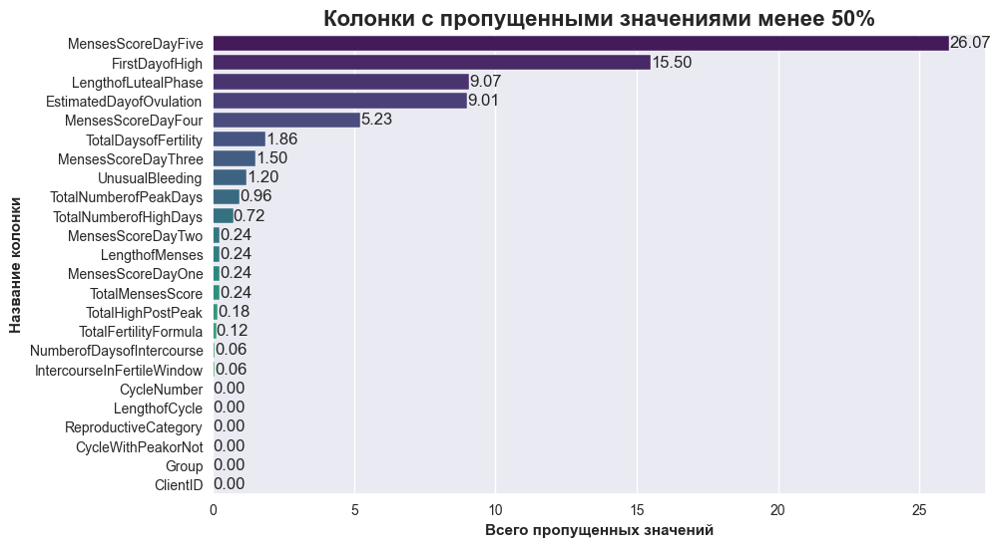

In [23]:
# теперь отрисуем все то же самое, но для процента пропущенных значений < 50%
sns.set_style('darkgrid')
plt.figure(figsize=(10,6))

ax = sns.barplot(data=null_values[null_values["Процент пропущенных значений"] < 50],
                 x="Процент пропущенных значений", y="Название колонки", palette="viridis")

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')

plt.title('Колонки с пропущенными значениями менее 50%', fontsize=16, fontweight='bold')
plt.xlabel('Всего пропущенных значений', fontweight='bold')
plt.ylabel('Название колонки',fontweight='bold')

task.get_logger().report_matplotlib_figure('Колонки с пропущенными значениями менее 50%',
                                           series = 'First plots',
                                           figure=plt.gcf())

plt.show()

In [24]:
# убираем колонки где больше чем 50% пропущенных значений
remove_cols = null_values[null_values["Процент пропущенных значений"] >= 50]["Название колонки"].tolist()
df = df.drop(columns=remove_cols)
# также убираем айди клиента, это не дает важной информации
df = df.drop(columns="ClientID")

In [25]:
# смотрим на типы данных в каждой колонке
df.dtypes

CycleNumber                    int64
Group                          int64
CycleWithPeakorNot             int64
ReproductiveCategory           int64
LengthofCycle                  int64
EstimatedDayofOvulation       object
LengthofLutealPhase           object
FirstDayofHigh                object
TotalNumberofHighDays         object
TotalHighPostPeak             object
TotalNumberofPeakDays         object
TotalDaysofFertility          object
TotalFertilityFormula         object
LengthofMenses                object
MensesScoreDayOne             object
MensesScoreDayTwo             object
MensesScoreDayThree           object
MensesScoreDayFour            object
MensesScoreDayFive            object
TotalMensesScore              object
NumberofDaysofIntercourse     object
IntercourseInFertileWindow    object
UnusualBleeding               object
dtype: object

In [ ]:
# после основной очистки посмотрим, что выдаст pandas_profiling
profile = ProfileReport(df, title="Profiling Report")
profile.to_widgets()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# сохраняем отчет профайлера в html
profile.to_file("data_profiler_report.html")

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Предобработка данных перед обучением

In [26]:
# возьмем категориальные колонки
categorical_columns = df.select_dtypes(include= object).columns

encoder = LabelEncoder()

# заменим категории на цифры
for cols in categorical_columns:
        df[cols] = pd.to_numeric(df[cols])
        df[cols] = encoder.fit_transform(df[cols])

# заменяем пропущенные значения на средние
for i in df.columns:
    if (df[i].isnull().sum()) > 100:
        df[i] = df[i].fillna(df[i].mean())

In [27]:
# проверяем, что не оставили пропусков
df.isnull().sum()

CycleNumber                   0
Group                         0
CycleWithPeakorNot            0
ReproductiveCategory          0
LengthofCycle                 0
EstimatedDayofOvulation       0
LengthofLutealPhase           0
FirstDayofHigh                0
TotalNumberofHighDays         0
TotalHighPostPeak             0
TotalNumberofPeakDays         0
TotalDaysofFertility          0
TotalFertilityFormula         0
LengthofMenses                0
MensesScoreDayOne             0
MensesScoreDayTwo             0
MensesScoreDayThree           0
MensesScoreDayFour            0
MensesScoreDayFive            0
TotalMensesScore              0
NumberofDaysofIntercourse     0
IntercourseInFertileWindow    0
UnusualBleeding               0
dtype: int64

In [28]:
# убираем дублирующиеся строки и смотрим на данные
df = df.drop_duplicates()
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CycleNumber,1652.0,8.076877,6.603838,1.0,3.0,7.0,11.0,45.0
Group,1652.0,0.385593,0.486883,0.0,0.0,0.0,1.0,1.0
CycleWithPeakorNot,1652.0,0.913438,0.281277,0.0,1.0,1.0,1.0,1.0
ReproductiveCategory,1652.0,0.055690,0.481566,0.0,0.0,0.0,0.0,9.0
LengthofCycle,1652.0,29.321429,3.890562,18.0,27.0,29.0,31.0,54.0
EstimatedDayofOvulation,1652.0,10.214286,5.241020,0.0,7.0,9.0,12.0,23.0
LengthofLutealPhase,1652.0,11.953390,5.877480,0.0,9.0,10.0,12.0,29.0
FirstDayofHigh,1652.0,9.090194,6.243279,0.0,5.0,7.0,11.0,22.0
TotalNumberofHighDays,1652.0,4.392252,3.841328,0.0,2.0,3.0,5.0,23.0
TotalHighPostPeak,1652.0,0.148910,0.700164,0.0,0.0,0.0,0.0,8.0


In [29]:
# считаем выбросы и их процент
outliers_percentages = []

for col in df.columns:
    # отрезаем по интерквантильному интервалу
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1

    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    outliers_count = ((df[col] < lower_bound) | (df[col] > upper_bound)).sum()
    outliers_percentage = (outliers_count / len(df[col])) * 100

    outliers_percentages.append({'Колонка': col, 'Процент выбросов': outliers_percentage})

outliers_df = pd.DataFrame(outliers_percentages)
outliers_df = outliers_df.sort_values(by='Процент выбросов', ascending=False)

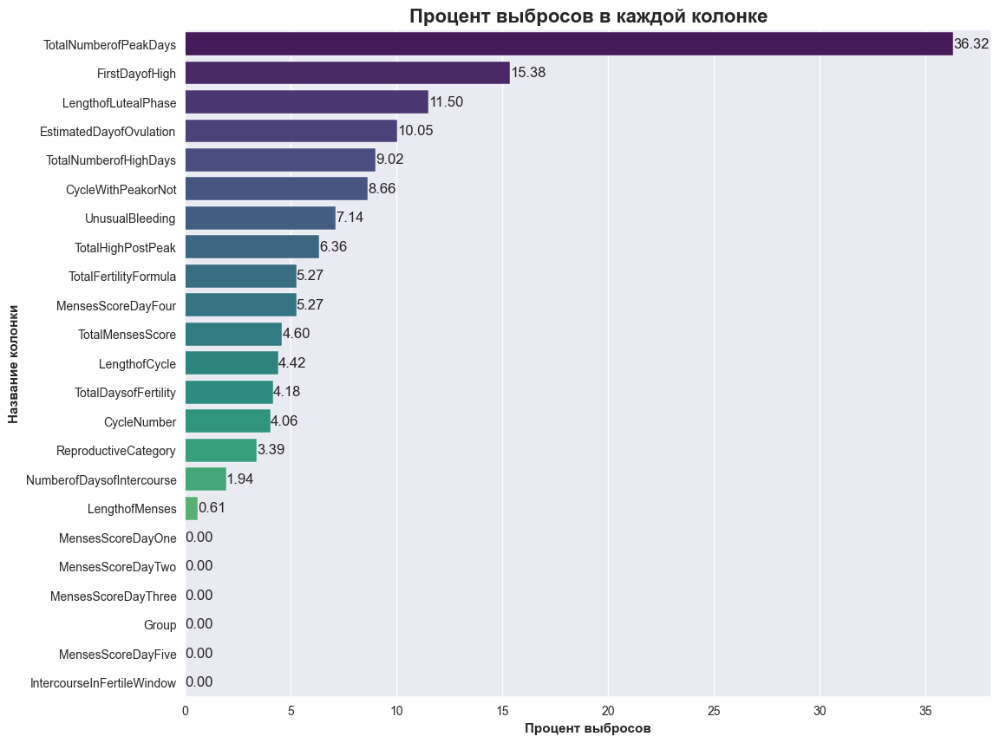

In [30]:
# визуализируем полученную информацию
sns.set_style('darkgrid')
plt.figure(figsize=(12,10))
ax = sns.barplot(data= outliers_df , x="Процент выбросов", y= "Колонка" , palette="viridis")

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f')

plt.title('Процент выбросов в каждой колонке', fontsize=16, fontweight='bold')
plt.xlabel('Процент выбросов', fontweight='bold')
plt.ylabel('Название колонки',fontweight='bold')

task.get_logger().report_matplotlib_figure('Процент выбросов в каждой колонке',
                                           series='First plots',
                                           figure=plt.gcf())

plt.show()

In [31]:
# строим корреляционную схему

for col in df.columns:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1

    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # отрезаем выбросы по IQR
    outliers = (df[col] < lower_bound) | (df[col] > upper_bound)
    outlier_percentage = outliers.mean() * 100

    df[col] = df[col].where(~outliers, np.mean(df[col]))

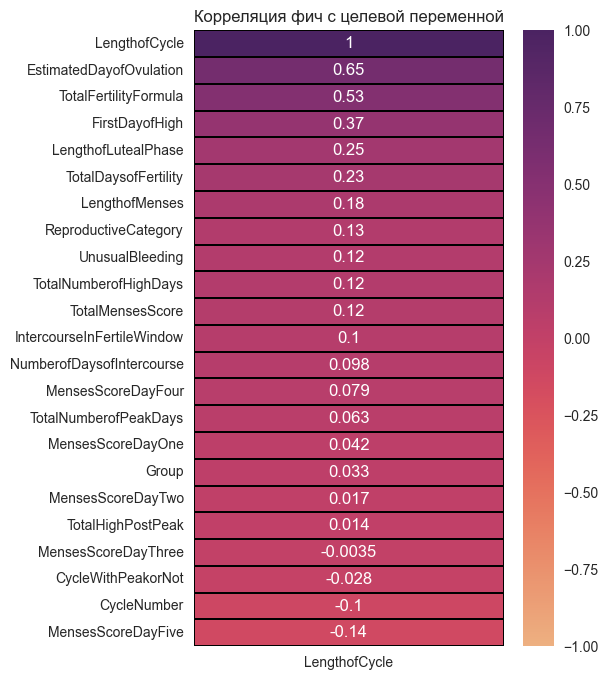

In [32]:
plt.figure(figsize=(5,8))
# длина цикла - целевая переменная
sns.heatmap(df.corr()['LengthofCycle'].sort_values(ascending=False).to_frame(),
            annot=True, vmin=-1, vmax=1, linewidths=0.3, linecolor='black', cmap= 'flare')
plt.title('Корреляция фич с целевой переменной')

task.get_logger().report_matplotlib_figure('Корреляция фич с целевой переменной',
                                           series='First plots',
                                           figure=plt.gcf())

plt.show()

In [ ]:
# сохраняем датасет перед ClearML
df.to_csv('menstrual_cycle_data_cleared.csv', index=False)

In [ ]:
# обновим датасет ClearML после обработки
from clearml import Dataset

dataset = Dataset.get(dataset_project='Menstrual Cycle Calender', dataset_name='Menstrual Cycle Data')
new_dataset = Dataset.create(dataset_name='Menstrual Cycle Data', dataset_project='Menstrual Cycle Calender', parent_datasets=[dataset.id])
new_dataset.add_files('menstrual_cycle_data_cleared.csv')
new_dataset.upload()
new_dataset.finalize()

ClearML results page: https://app.clear.ml/projects/aa0805ee1ef4446f803e1b7f86e1b8f0/experiments/beaf4db8231a4bfca828fdd34e3fee66/output/log
ClearML dataset page: https://app.clear.ml/datasets/simple/aa0805ee1ef4446f803e1b7f86e1b8f0/experiments/beaf4db8231a4bfca828fdd34e3fee66
Uploading dataset changes (1 files compressed to 22.87 KiB) to https://files.clear.ml
File compression and upload completed: total size 22.87 KiB, 1 chunk(s) stored (average size 22.87 KiB)


True

In [33]:
# делим данные на целевую переменную и датасет
y = df["LengthofCycle"]
x = df.drop('LengthofCycle', axis=1)
scaler = StandardScaler()
x = scaler.fit_transform(x)

# Обучение моделей ML

Начнем с автоматического pycaret

In [37]:
# выбор модели с помощью pycaret
my_exp = setup(data = df, target = 'LengthofCycle', session_id=1)

In [44]:
# сравниваем модели
best_model = compare_models()

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,12:23:50
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

2024-12-14 12:23:57,860 - clearml.storage - INFO - Uploading: 18.00MB to /Users/a.d.tsvetkova/Documents/menstrual_cycle_prediction/team_project_ML.ipynb



                                            0% | 0.00/18.0 MB [00:00<?, ?MB/s]: 
█████████████████▊                56% | 10.00/18.0 MB [00:01<00:01,  6.82MB/s]: 
██████████████████████████▋       83% | 15.00/18.0 MB [00:03<00:00,  4.62MB/s]: 
███████████████████████████████▉ 100% | 18.00/18.0 MB [00:05<00:00,  3.24MB/s]: 


In [57]:
best_model

ExtraTreesRegressor(n_jobs=-1, random_state=1)

In [46]:
# логируемся в clearml
task.connect(best_model)
task.upload_artifact(name="best_model_pycaret", artifact_object=best_model)

True

In [47]:
# достаем и тюним лучшую модель
et = create_model('et')
tuned_et = tune_model(et)

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,12:24:54
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,12:24:55
Status,. . . . . . . . . . . . . . . . . .,Loading Dependencies
Estimator,. . . . . . . . . . . . . . . . . .,Compiling Library


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


█████████████████████████████████ 100% | 5.28/5.28 MB [00:16<00:00,  3.14s/MB]: 


2024-12-14 12:25:08,517 - clearml.storage - INFO - Uploading: 18.00MB to /Users/a.d.tsvetkova/Documents/menstrual_cycle_prediction/team_project_ML.ipynb
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [48]:
# логируемся в clearml
task.connect(tuned_et)
task.upload_artifact(name="best_model_tuned_pycaret", artifact_object=tuned_et)

2024-12-14 12:28:21,670 - clearml.storage - INFO - Uploading: 18.00MB to /Users/a.d.tsvetkova/Documents/menstrual_cycle_prediction/team_project_ML.ipynb


                                            0% | 0.00/18.0 MB [00:00<?, ?MB/s]: 

True

2024-12-14 12:36:04,584 - clearml.storage - INFO - Uploading: 17.90MB to /Users/a.d.tsvetkova/Documents/menstrual_cycle_prediction/team_project_ML.ipynb


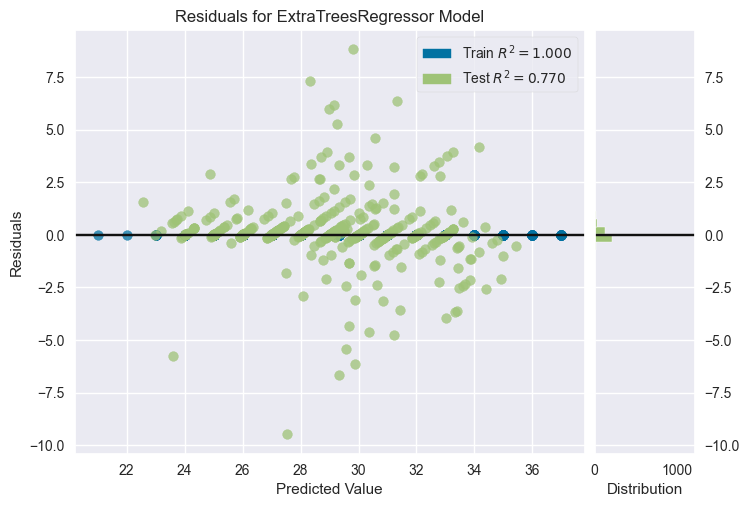

In [50]:
# диаграмма остатков
fig = plot_model(tuned_et)

In [52]:
task.get_logger().report_matplotlib_figure('Диаграмма остатков',
                                           series='First plots',
                                           figure=fig)

2024-12-14 12:39:15,215 - clearml.storage - INFO - Uploading: 17.97MB to /Users/a.d.tsvetkova/Documents/menstrual_cycle_prediction/team_project_ML.ipynb


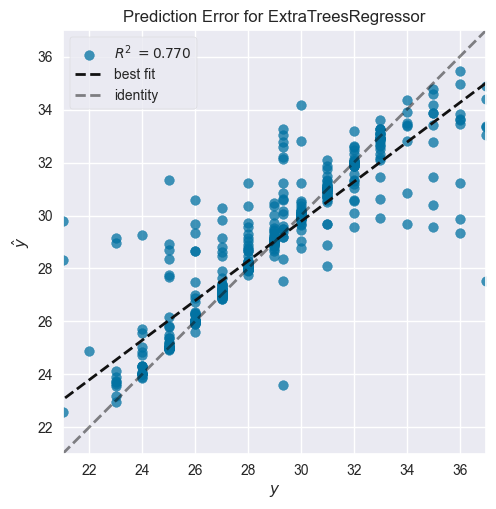

In [55]:
# ошибки предсказаний
fig = plot_model(tuned_et, plot = 'error')
task.get_logger().report_matplotlib_figure('Ошибки предсказаний',
                                           series='First plots',
                                           figure=fig)

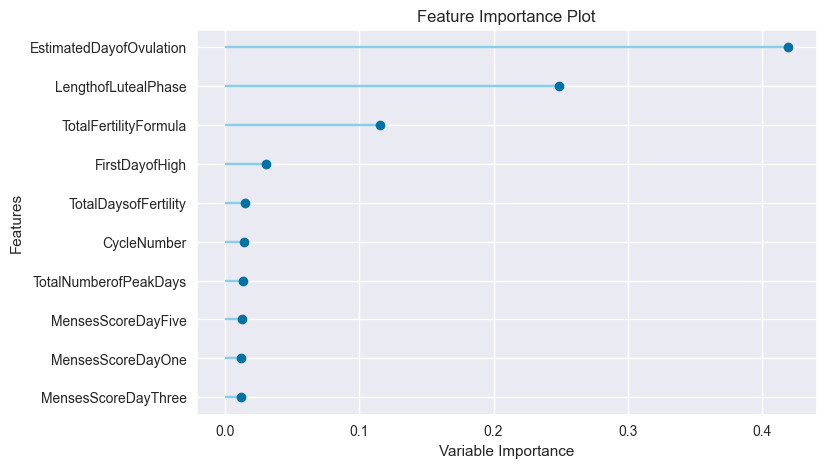

In [56]:
# вклад фичей в целевую переменную
plot_model(tuned_et, plot='feature')
task.get_logger().report_matplotlib_figure('Вклад фичей в целевую переменную',
                                           series='First plots',
                                           figure=fig)

In [62]:
# обучаем две модельки из коробки

# инициализируем две модели
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
et_model = ExtraTreesRegressor(n_estimators=100, random_state=42)

# создаем k-fold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# считаем скоры и среднее
rf_scores = cross_val_score(rf_model, x, y, cv=kf, scoring='neg_mean_squared_error')
rf_rmse_scores = np.sqrt(-rf_scores)
rf_mean_rmse = rf_rmse_scores.mean()
rf_std_rmse = rf_rmse_scores.std()

# логируемся в ClearML
task.get_logger().report_scalar("Random Forest RMSE", "mean", iteration=1, value=rf_mean_rmse)
task.get_logger().report_scalar("Random Forest RMSE", "std", iteration=1, value=rf_std_rmse)

print("Random Forest RMSE: ", rf_rmse_scores.mean(), "±", rf_rmse_scores.std())

# считаем скоры и среднее
et_scores = cross_val_score(et_model, x, y, cv=kf, scoring='neg_mean_squared_error')
et_rmse_scores = np.sqrt(-et_scores)
et_mean_rmse = et_rmse_scores.mean()
et_std_rmse = et_rmse_scores.std()

# логируемся в ClearML
task.get_logger().report_scalar("Extra Trees RMSE", "mean", iteration=1, value=et_mean_rmse)
task.get_logger().report_scalar("Extra Trees RMSE", "std", iteration=1, value=et_std_rmse)

print("Extra Trees RMSE: ", et_rmse_scores.mean(), "±", et_rmse_scores.std())

2024-12-14 13:25:25,519 - clearml.storage - INFO - Uploading: 17.98MB to /Users/a.d.tsvetkova/Documents/menstrual_cycle_prediction/team_project_ML.ipynb


                                           0% | 0.00/17.98 MB [00:00<?, ?MB/s]: 

Random Forest RMSE:  1.2999290176272251 ± 0.09516920149614867


█████████████████▏               56% | 10.00/17.98 MB [00:01<00:01,  7.39MB/s]: 

Extra Trees RMSE:  1.3005409954434608 ± 0.06881905663017804


Лучшая по итогам k-fold - RandomForestRegressor. Теперь потюним ему параметры с помощью Optuna

In [66]:
# тюним параметры с помощью Optuna

# разделяем на X, y

y = df["LengthofCycle"]
x = df.drop('LengthofCycle', axis=1)
scaler = StandardScaler()
x = scaler.fit_transform(x)

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200),
        'max_depth': trial.suggest_int('max_depth', 5, 50),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10)}

    # логируем параметры
    task.connect(params)

    model = RandomForestRegressor(
        **params,
        random_state=42,
        warm_start=True
    )

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # логируем метрику
    mse = mean_squared_error(y_test, y_pred)
    task.get_logger().report_scalar(title="Random Forest Trials", series="Mean Squared Error", value=mse, iteration=trial.number)

    return mse

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=30)

print("Лучшие гиперпараметры:", study.best_params)
print("Лучшее значение RMSE:", study.best_value)

[I 2024-12-14 13:44:34,674] A new study created in memory with name: no-name-b6e13b09-3d02-4709-ab94-04e3b50f255f
[I 2024-12-14 13:44:36,534] Trial 0 finished with value: 2.293244424514086 and parameters: {'n_estimators': 137, 'max_depth': 14, 'min_samples_split': 4, 'min_samples_leaf': 10}. Best is trial 0 with value: 2.293244424514086.
[I 2024-12-14 13:44:38,572] Trial 1 finished with value: 1.754148819230497 and parameters: {'n_estimators': 72, 'max_depth': 27, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 1 with value: 1.754148819230497.
█████████████████▏               56% | 10.00/17.99 MB [00:04<00:03,  2.14MB/s]: [I 2024-12-14 13:44:40,654] Trial 2 finished with value: 2.1458830704374403 and parameters: {'n_estimators': 74, 'max_depth': 19, 'min_samples_split': 8, 'min_samples_leaf': 7}. Best is trial 1 with value: 1.754148819230497.
[I 2024-12-14 13:44:42,031] Trial 3 finished with value: 2.17561982594668 and parameters: {'n_estimators': 173, 'max_depth': 13, 'm

2024-12-14 13:45:02,361 - clearml.storage - INFO - Uploading: 17.99MB to /Users/a.d.tsvetkova/Documents/menstrual_cycle_prediction/team_project_ML.ipynb


                                           0% | 0.00/17.99 MB [00:00<?, ?MB/s]: [I 2024-12-14 13:45:02,968] Trial 15 finished with value: 1.8119358793639158 and parameters: {'n_estimators': 176, 'max_depth': 41, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 13 with value: 1.6236667508448221.
█████████████████▏               56% | 10.00/17.99 MB [00:03<00:02,  2.85MB/s]: [I 2024-12-14 13:45:07,666] Trial 16 finished with value: 1.6554621376368257 and parameters: {'n_estimators': 72, 'max_depth': 32, 'min_samples_split': 3, 'min_samples_leaf': 1}. Best is trial 13 with value: 1.6236667508448221.
██████████████████████████████▉ 100% | 17.98/17.99 MB [00:09<00:00,  1.69MB/s]: [I 2024-12-14 13:45:13,366] Trial 17 finished with value: 1.6723987234917683 and parameters: {'n_estimators': 191, 'max_depth': 23, 'min_samples_split': 5, 'min_samples_leaf': 2}. Best is trial 13 with value: 1.6236667508448221.
██████████████████████████████▉ 100% | 17.99/17.99 MB [00:11<00:00,  1.56M

Лучшие гиперпараметры: {'n_estimators': 53, 'max_depth': 32, 'min_samples_split': 4, 'min_samples_leaf': 1}
Лучшее значение RMSE: 1.6236667508448221


In [67]:
# обучаем лучшую модель на всех данных и сохраняем ее
import pickle

best_params = study.best_params
best_model = RandomForestRegressor(**best_params,
                                   random_state=42,
                                   warm_start=True)
best_model.fit(x, y)
with open('best_model.pkl', 'wb') as f:
    pickle.dump(best_model, f)

task.upload_artifact(name=f'best_RF_model', artifact_object=best_model)

True

In [68]:
# закрываем сессию ClearML
task.close()

██████████████████████████████▉ 100% | 17.99/17.99 MB [00:05<00:00,  3.16MB/s]: 
██████████████████████████████▉ 100% | 17.99/17.99 MB [00:06<00:00,  2.95MB/s]: 
